<div style="background-color: #ccffcc; padding: 10px;">
    <h1> Tutorial 1 </h1> 
    <h2> Classification of Volcanic Deformation using Convolutional Neural Networks </h2>
</div>    

## Overview

This tutorial is based off of work done by Matthew Gaddes and full code [VUDLNet_21](https://github.com/matthew-gaddes/VUDLNet_21)<sup>[1]</sup>. Creating a Convolutional Neautral Network that will dectect and localise deformation in Sentiel-1 Interferogram. A database of labelled Sentinel-1 data hosted at [VolcNet](https://github.com/matthew-gaddes/VolcNet) is used to train the CNN. 


A small subset of the data required is provided to create a tutorial that will both run in a short time frame and not be over file size limits set by GitHub. An option is included to download and use larger bottleneck files created from a larger data set to see a higher performance example. 

[1] [Matthew Gaddes, Andy Hooper , Fabien Albino 2021](https://eartharxiv.org/repository/view/1969/)

### Summary for non voclanologists

Interferograms are ground deformation maps produced by interferometric4synthetic aperture radar (InSAR). Certain deformation patterns are associated with different types sources of deformation (volcanic activity). A trained person can by eye identify the source and location but when looking at large number automation of this is required. It is important to not only specify whether or not the interferogram shows deformation but also the type of deformation.
<a href="https://www.usgs.gov/media/images/interferogram-period-april-6-june-2-2019">
<img src="https://prd-wret.s3.us-west-2.amazonaws.com/assets/palladium/production/s3fs-public/styles/full_width/public/thumbnails/image/image1-1417.png" width="500" height="600" alt="https://www.usgs.gov/center-news/volcano-watch-reading-rainbow-how-interpret-interferogram">
</a>
*taken from USGS*

<div style="background-color: #ccffcc; padding: 10px;">

<h1>Convolutional Neural Networks </h1>

This tutorial will use Convolutional Neural Networks to classify volcanic defomation.
 
## The very basics
    
If you know nothing about neural networks there is a [toy neural network python code example](https://github.com/cemac/LIFD_ENV_ML_NOTEBOOKS/tree/main/ToyNeuralNetwork) included in the [LIFD ENV ML Notebooks Repository]( https://github.com/cemac/LIFD_ENV_ML_NOTEBOOKS). Creating a 2 layer neural network to illustrate the fundamentals of how Neural Networks work and the equivant code using the python machine learning library [keras](https://keras.io/).
    
## Reccomended reading 

The in depth theory behind convolution neural networks will not be covered here as this tutorial is focusing on how to used them for a certain earth science application. If you wish to learn more here are some great starting points.     
    
1. [The very basics in a Victor Zhou Blog](https://victorzhou.com/blog/intro-to-cnns-part-1/)
2. [A deep dive into CNNs in towards data science](https://towardsdatascience.com/deep-dive-into-convolutional-networks-48db75969fdf)
3. [More information on transfer learning (using pretrained models)](https://machinelearningmastery.com/how-to-use-transfer-learning-when-developing-convolutional-neural-network-models/)
4. [Section 5 of the example ipython note books from the fchollet deep learning with python repository](https://github.com/fchollet/deep-learning-with-python-notebooks)   
    
</div>



<hr>


<div style="background-color: #e6ccff; padding: 10px;">
    
<h1> Machine Learning Theory </h1>
<a href="https://towardsdatascience.com/deep-dive-into-convolutional-networks-48db75969fdf">
<img src="https://miro.medium.com/max/2510/1*XbuW8WuRrAY5pC4t-9DZAQ.jpeg">
</a>

To create a Covoltional neural network that both slassifys the type of demformation and to locate it  a "two headed model" is built to return both from one forward pass of an interferogram through the network. As models have already be trained to identify features it is possible to transfer weights from other models designed for different problems. In this tutorial the VGG16 model is used as this was found to be sensitive to the signals of interest in interferograms.  
    
    
</div>    
  

  
<div style="background-color: #cce5ff; padding: 10px;">

<h1> Python </h1>

For this tutorial we'll be working [Keras](https://keras.io/) 

</div>
    
<hr>

<div style="background-color: #ffffcc; padding: 10px;">
    
<h1> Requirements </h1>

These notebooks should run 

<h2> Python Packages: </h2>

* Python 3
* Keras
* tensorflow
* pydot
* graphviz
* ipdb
* matplotlib=3.0 
* basemap-data-hires
* geopy

<h2> Data Requirements</h2>
This notebook referes to some data included in the git hub repositroy
    
</div>


**Contents:**

1. [Load in real and Syntheric Data](#Load-In-Provided-Data)
2. [Augment Real Data](#GetData)
3. [Merge and rescale synthetic data](#Merge_and_Rescale)
4. [Compute bottleneck features.](#Compute_Bottleneck_features)
5. [Train fully connected network](#Train_CNN)
6. [Fine tune the fully connected network and the 5th convolutional block.](#Fine_Tunning) 


<div style="background-color: #cce5ff; padding: 10px;">
Load in all required modules (includig some auxillary code) and turn off warnings. Make sure Keras session is clear
</div>

In [1]:
# For readability: disable warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
# import modules
# general file system utilites
import sys
import glob
import os
from pathlib import Path
# Maths and 
import numpy as np
import numpy.ma as ma 
# Premade data is provided as pickles
import pickle
# Plotting utilies
import matplotlib
import matplotlib.pyplot as plt
import shutil
# Machine learning Library Keras
import keras
#from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from keras import backend as K
from keras import losses, optimizers
from keras.applications.vgg16 import VGG16
from keras.utils.vis_utils import plot_model
from keras.models import Model, load_model
from keras.layers import Input
# import axillary plotting functions
# these functions 
from aux_functions import *

In [3]:
# Clear Keras session
K.clear_session()  



# Load In Provided Data 

<div style="background-color: #ccffcc; padding: 10px;">

    
The model will be trained on a large dataset of synthetic interferograms which feature labels of both the type and location of any deformation and the performaced improved by including a small amount of augmented real Sentinel-1 data.

The first steps to prepare the data have be predone synthetic interferograms are provided in the `data` folder.

<h1> Sythetic Interferograms </h1>

As this is a tutorial focusing on Machine learning the Syntheric Interferograms are provided as pickle files. These files were genrated using [SyInteferoPy](https://github.com/matthew-gaddes/SyInterferoPy). [SyInteferoPy](https://github.com/matthew-gaddes/SyInterferoPy) generates synthetic images similar to those porduced by Sentinel-1 satellites from the SRTM3 digital elevation model (DEM) <sup>[2]</sup>
   
[2] [Gaddes & Bagnardi 2019](https://agupubs.onlinelibrary.wiley.com/doi/abs/10.1029/2019JB017519)
    
</div>

<div style="background-color: #ffcdcc; padding: 10px;">    


If you wanted to generate your own synthetic data you would need to use the tools in [SyInteferoPy](https://github.com/matthew-gaddes/SyInterferoPy). [SyInteferoPy](https://github.com/matthew-gaddes/SyInterferoPy) and the pickled volcano dem data `data/volcano_dems.pkl`


    
```bash
 git submodule add https://github.com/matthew-gaddes/SyInterferoPy SyInterferoPy
 dependency_paths = {'syinterferopy_bin' : 'SyInterferoPy/lib/}
 sys.path.append(dependency_paths['syinterferopy_bin'])
 
```    
```python
from random_generation_functions import create_random_synthetic_ifgs  
os.mkdir(Path(f"./data/synthetic_data/"))
for file_n in range(synthetic_ifgs_n_files):
    print(f"Generating file {file_n} of {synthetic_ifgs_n_files} files.  ")
    X_all, Y_class, Y_loc, Y_source_kwargs = create_random_synthetic_ifgs(volcano_dems, 
                                                                **synthetic_ifgs_settings)
    # convert to one hot encoding (from class labels)
    Y_class = keras.utils.to_categorical(Y_class, len(synthetic_ifgs_settings['defo_sources']), 
                                                        dtype='float32')          
    with open(Path(f'./data/synthetic_data/data_file_{file_n}.pkl'), 'wb') as f:
        pickle.dump(X_all[synthetic_ifgs_settings['outputs'][0]], f)                                               
        pickle.dump(Y_class, f)
        pickle.dump(Y_loc, f)
    f.close()
    del X_all, Y_class, Y_loc
# output the settings as a text file so that we know how data were generated in the future.  
with open(f"./data/synthetic_data/synth_data_settings.txt", 'w') as f:       
    print(f"Number of data per file : {ifg_settings['n_per_file']}" ,file = f)
    print(f"Number of files: {synthetic_ifgs_n_files}" ,file = f)
    for key in synthetic_ifgs_settings:
        print(f"{key} : {synthetic_ifgs_settings[key]}", file = f)
```
    
</div>

<div style="background-color: #ffffcc; padding: 10px;">
    <h3>Settings for generating interfeorgrams.</h3>

Passing this information to [SyInteferoPy](https://github.com/matthew-gaddes/SyInterferoPy). [SyInteferoPy](https://github.com/matthew-gaddes/SyInterferoPy) will generate 650 synthetic Interfograms

* **n_per_file:** number of ifgs per data file.  
* **synthetic_ifgs_n_files:** numer of files of synthetic data
* **defo_sources:** deformation patterns that will be included in the dataset.  
* **n_ifgs:** the number of synthetic interferograms to generate PER FILE
* **n_pix:** number of 3 arc second pixels (~90m) in x and y direction
* **outputs:**  channel outputs.  uuu = unwrapped across all 3
* **intermediate_figure:**  if True, a figure showing the steps taken during creation of each ifg is displayed.  
* **cov_coh_scale:** The length scale of the incoherent areas, in meters.  A smaller value creates smaller patches, and a larger one creates larger pathces.  
* **coh_threshold:** if 1, there are no areas of incoherence, if 0 all of ifg is incoherent.  
* **min_deformation:** deformation pattern must have a signals of at least this many metres.  
* **max_deformation:** deformation pattern must have a signal no bigger than this many metres.  
* **snr_threshold signal:** to noise ratio (deformation vs turbulent and topo APS) to ensure that deformation is visible.  A lower value creates more subtle deformation signals.
* **turb_aps_mean:** turbulent APS will have, on average, a maximum strenghto this in metres (e.g 0.02 = 2cm)
* **turb_aps_length:** turbulent APS will be correlated on this length scale, in metres.  

</div>

In [4]:
# Define some settings (outlined above)
ifg_settings            = {'n_per_file'         : 50}    # number of ifgs per data file.  
synthetic_ifgs_n_files  =  13                            # numer of files of synthetic data
synthetic_ifgs_settings = {'defo_sources'       : ['dyke', 'sill', 'no_def'],  
                           'n_ifgs'             : ifg_settings['n_per_file'],  
                           'n_pix'              : 224,   
                           'outputs'            : ['uuu'],
                           'cov_coh_scale'      : 5000,  
                           'coh_threshold'      : 0.7,  
                           'min_deformation'    : 0.05,  
                           'max_deformation'    : 0.25,
                           'snr_threshold'      : 2.0, 
                           'turb_aps_mean'      : 0.02, 
                           'turb_aps_length'    : 5000} 
n_synth_data = ifg_settings['n_per_file'] * synthetic_ifgs_n_files
print('\nDetermining if files containing the synthetic deformation patterns exist...\n ', end = '')
data_files = glob.glob(str(Path(f"./data/synthetic_data/*.pkl")))
                
if len(data_files) == synthetic_ifgs_n_files:
    print(f"\nThe correct number of files were found ({synthetic_ifgs_n_files}) so no new ones will be generated.  "
          f"\nHowever, this doesn't guarantee that the files were made using the settings in synthetic_ifgs_settings." 
          f"\nCheck synth_data_settings.txt to be sure.   ")
else:
    print(f"\nCheck for pickles- do you have the data files required (in GitHub Repo)")


Determining if files containing the synthetic deformation patterns exist...
 
The correct number of files were found (13) so no new ones will be generated.  
However, this doesn't guarantee that the files were made using the settings in synthetic_ifgs_settings.
Check synth_data_settings.txt to be sure.   


<div style="background-color: #ccffcc; padding: 10px;">

<h1> Load in Real Data</h1>

Included in this repostitory is a git submodule [VolcNet](https://github.com/matthew-gaddes/VolcNet) which is a set of 250 labelled unwrapped interferograms that contain labels of both the type of deformation (including examples of no deformation), and the location of deformation within the interferograms. In the form of pickle files, i.e. interferrograms have been stored as masked numpy arrays and labeled with location and defformation source.
    
If you have not already then please in your repositoy directory run the following code. 
    
```bash
git submodule init
git submodule update --init --recursive
```

This labled data will be used to train our model.
    
</div>

<div style="background-color: #cce5ff; padding: 10px;">
The below code checks for the Volcnet files and uses plotting functions in the provided `aux_functions.py` to show the data.
    
For an example file it will show a plot of the interferrogram and give the lable of the deformation source (if applicable).

</div>

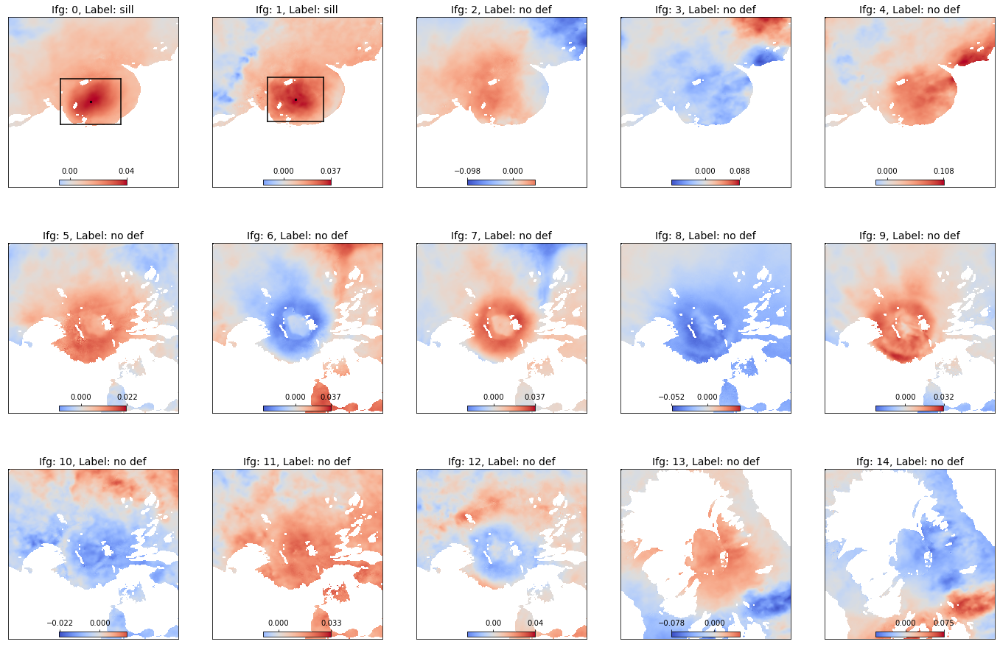

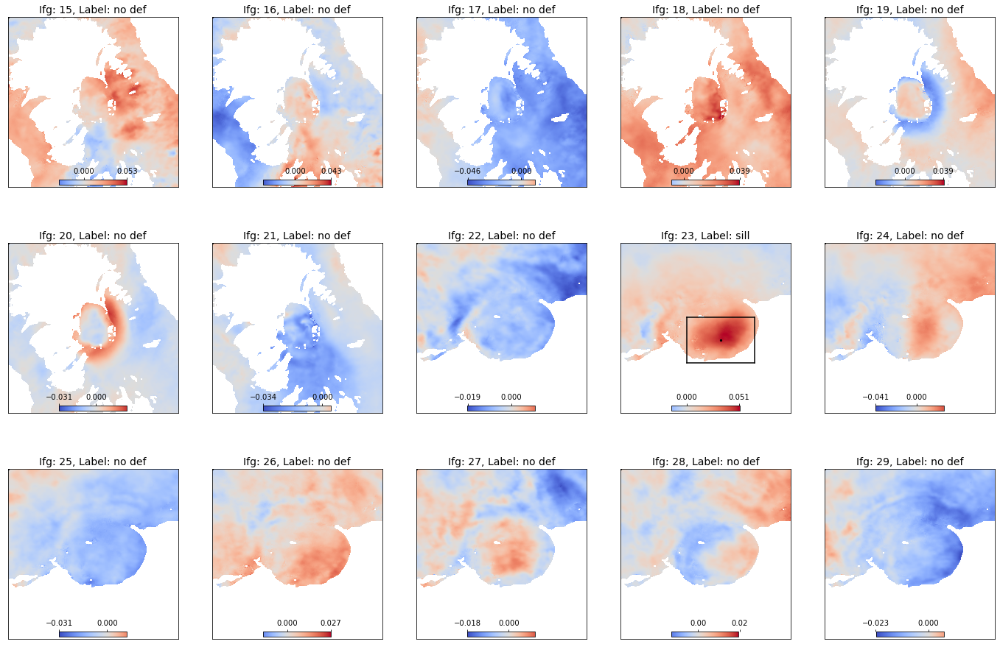

In [23]:
# Load the real data
# Note that these are in metres, and use one hot encoding for the class, 
# and are masked arrays (incoherence and water are masked)
VolcNet_path = Path('./VolcNet')
real_ifg_settings       = {'augmentation_factor' : 3}
#  get a list of the paths to all the VolcNet files
VolcNet_files = sorted(glob.glob(str(VolcNet_path / '*.pkl')))         
if len(VolcNet_files) == 0:
    raise Exception('No VolcNet files have been found.'  +
                    'Perhaps the path is wrong? Or perhaps you only want to use synthetic data?'+  
                    'In which case, this section can be removed.  Exiting...')

X_1s = []
Y_class_1s = []
Y_loc_1s = []
for VolcNet_file in VolcNet_files:
    X_1, Y_class_1, Y_loc_1 = open_VolcNet_file(VolcNet_file, synthetic_ifgs_settings['defo_sources'])
    X_1s.append(X_1)
    Y_class_1s.append(Y_class_1)
    Y_loc_1s.append(Y_loc_1)
X = ma.concatenate(X_1s, axis = 0)
Y_class = np.concatenate(Y_class_1s, axis = 0)
Y_loc = np.concatenate(Y_loc_1s, axis = 0)
del X_1s, Y_class_1s, Y_loc_1s, X_1, Y_class_1, Y_loc_1
# plot the data in it (note that this can be across multiople windows) 
plot_data_class_loc_caller(X[:30,], Y_class[:30,], Y_loc[:30,], source_names = ['dyke', 'sill', 'no def'], window_title = 'Sample of Real data')               


<div style="background-color: #ccffcc; padding: 10px;">
<h1> Augment Real data</h1>

    
</div>

In [6]:
def choose_for_augmentation(X, Y_class, Y_loc, n_per_class):
    """A function to randomly select only some of the data, but in  fashion that ensures that the classes are balanced 
    (i.e. there are equal numbers of each class).  Particularly useful if working with real data, and the classes
    are usually very unbalanced (lots of no_def lables, normally).  
    Inputs:
        X           | rank 4 array | data.  
        Y_class     | rank 2 array | One hot encoding of class labels
        Y_loc       | rank 2 array | locations of deformation
        n_per_class | int | number of data per class. e.g. 3
    Returns:
        X_sample           | rank 4 array | data.  
        Y_class_sample     | rank 2 array | One hot encoding of class labels
        Y_loc_sample       | rank 2 array | locations of deformation
    History:
        2019/??/?? | MEG | Written
        2019/10/28 | MEG | Update to handle dicts
        2020/10/29 | MEG | Write the docs.  
        2020/10/30 | MEG | Fix bug that was causing Y_class and Y_loc to become masked arrays.  
        
    """
    
    n_classes = Y_class.shape[1]        # only works if one hot encoding is used
    X_sample = []
    Y_class_sample = []
    Y_loc_sample = []
    
    for i in range(n_classes):                                                              # loop through each class
        args_class = np.ravel(np.argwhere(Y_class[:,i] != 0))                               # get the args of the data of this label
        args_sample = args_class[np.random.randint(0, len(args_class), n_per_class)]        # choose n_per_class of these (ie so we always choose the same number from each label)
        X_sample.append(X[args_sample, :,:,:])                                              # choose the data, and keep adding to a list (each item in the list is n_per_class_label x ny x nx n chanels)
        Y_class_sample.append(Y_class[args_sample, :])                                      # and class labels
        Y_loc_sample.append(Y_loc[args_sample, :])                                          # and location labels
    
    X_sample = ma.vstack(X_sample)                                                          # maskd array, merge along the first axis, so now have n_class x n_per_class of data
    Y_class_sample = np.vstack(Y_class_sample)                                              # normal numpy array, note that these would be in order of the class (ie calss 0 first, then class 1 etc.  )
    Y_loc_sample = np.vstack(Y_loc_sample)                                                  # also normal numpy array
    
    data_dict = {'X'       : X_sample,                                                      # package the data and labels together into a dict
                 'Y_class' : Y_class_sample,
                 'Y_loc'   : Y_loc_sample}
    
    data_dict_shuffled = shuffle_arrays(data_dict)                                          # shuffle (so that these aren't in the order of the class labels)
    
    X_sample = data_dict_shuffled['X']                                                      # and unpack as this function doesn't use dictionaries
    Y_class_sample = data_dict_shuffled['Y_class']
    Y_loc_sample = data_dict_shuffled['Y_loc']
    
    return X_sample, Y_class_sample, Y_loc_sample

def augment_data(X, Y_class, Y_loc, n_data = 500):
    """ A function to augment data and presserve the location label for any deformation.  
    Note that n_data is not particularly intelligent as many more data may be generated,
    and only n_data returned, so even if n_data is low, the function can still be slow.  
    Inputs:
        X           | rank 4 array | data.  
        Y_class     | rank 2 array | One hot encoding of class labels
        Y_loc       | rank 2 array | locations of deformation
        n_data      | int |
    Returns:
        X_aug           | rank 4 array | data.  
        Y_class_aug     | rank 2 array | One hot encoding of class labels
        Y_loc_aug       | rank 2 array | locations of deformation
    History:
        2019/??/?? | MEG | Written
        2020/10/29 | MEG | Write the docs.  
        2020_01_11 | MEG | Major rewrite to speed things up.  
    """

    # the three possible types of flip
    flips = ['none', 'up_down', 'left_right', 'both']     

    # 0: get the correct nunber of data    
    n_ifgs = X.shape[0]
    # package the data and labels together into a dict
    data_dict = {'X'       : X,                                                    
                 'Y_class' : Y_class,
                 'Y_loc'   : Y_loc}
    # if we have fewer ifgs than we need, repeat them
    if n_ifgs < n_data:      
        n_repeat = int(np.ceil(n_data / n_ifgs)) 
        # get the number of repeats needed (round up and make an int)
        data_dict['X'] = ma.repeat(data_dict['X'], axis = 0, repeats = n_repeat)
        data_dict['Y_class'] = np.repeat(data_dict['Y_class'], axis = 0, repeats = n_repeat)
        data_dict['Y_loc'] = np.repeat(data_dict['Y_loc'], axis = 0, repeats = n_repeat)
    # shuffle (so that these aren't in the order of the class labels)
    data_dict = shuffle_arrays(data_dict)        
    for key in data_dict:   
        # then crop them to the correct number
        data_dict[key] = data_dict[key][:n_data,]
    # and unpack as this function doesn't use dictionaries            
    X_aug = data_dict['X']    
    Y_class_aug = data_dict['Y_class']
    Y_loc_aug = data_dict['Y_loc']

    # 1: do the flips        
    for data_n in range(n_data):
        flip = flips[np.random.randint(0, len(flips))]  # choose a flip at random
        if flip != 'none':
            X_aug[data_n:data_n+1,], Y_loc_aug[data_n:data_n+1,] = augment_flip(X_aug[data_n:data_n+1,], Y_loc_aug[data_n:data_n+1,], flip)          # do the augmentaiton via one of the flips.  
        
    # 2: do the rotations
    X_aug, Y_loc_aug = augment_rotate(X_aug, Y_loc_aug) # rotate 
    
    # 3: Do the translations
    X_aug, Y_loc_aug = augment_translate(X_aug,  Y_loc_aug, max_translate = (20,20)) 
        
    return X_aug, Y_class_aug, Y_loc_aug      

<div style="background-color: #cce5ff; padding: 10px;">
Now we've written some functions to help augment the data it time to make it
    
If you've already done this the below code will check if the pickles already exist and only calculated the augemented data if required
    
</div>

In [7]:
n_augmented_files = int((X.shape[0] * real_ifg_settings['augmentation_factor']) / ifg_settings['n_per_file'])                   # detemine how many files will be needed, given the agumentation factor.  
print('    Determining if files containing the augmented real data exist.')
real_augmented_files = glob.glob(str(Path(f"./data/real/augmented/*.pkl")))             #
if len(real_augmented_files) == n_augmented_files:
    print(f"    The correct number of augmented real data files were found ({n_augmented_files}) so no new ones will be generated.  "
          f"However, this doesn't guarantee that the files were made using the current real data.  ")
else:
        try:
            shutil.rmtree(str(Path(f"./data/real/augmented/")))
        except:
            pass
        os.mkdir((Path(f"./data/real/augmented/")))
        print(f"    There are {X.shape[0]} real data and the augmentation factor is set" +
              "to {real_ifg_settings['augmentation_factor']}.  ")
        print(f"    With {ifg_settings['n_per_file']} data per file, the nearest integer" + 
              "number of files is {n_augmented_files}.  ")
        # loop through each file that is to be made
        for n_augmented_file in range(n_augmented_files):                                                                               
            print(f'    File {n_augmented_file} of {n_augmented_files}...', end = '')  
            X_sample, Y_class_sample, Y_loc_sample = choose_for_augmentation(X, Y_class, Y_loc,                                         # make a new selection of the data with balanced classes
                                                                              n_per_class = int(X.shape[0] / Y_class.shape[1]))          # set it so there are as many per class as there are (on average) for the real data.  
            X_aug, Y_class_aug, Y_loc_aug = augment_data(X_sample, Y_class_sample, Y_loc_sample,                                        # augment the sample of real data
                                                          n_data = ifg_settings['n_per_file'])                                           # make as many new data as are set to be in a single file.  
        
            with open(f"./data/real/augmented/data_file_{n_augmented_file}.pkl", 'wb') as f:                                        # save the output as a pickle
                pickle.dump(X_aug, f)
                pickle.dump(Y_class_aug, f)
                pickle.dump(Y_loc_aug, f)
            f.close()
            print('Done!')
        print('Done!')

    Determining if files containing the augmented real data exist.
    There are 225 real data and the augmentation factor is setto {real_ifg_settings['augmentation_factor']}.  
    With 50 data per file, the nearest integernumber of files is {n_augmented_files}.  
    File 0 of 13...Done!
    File 1 of 13...Done!
    File 2 of 13...Done!
    File 3 of 13...Done!
    File 4 of 13...Done!
    File 5 of 13...Done!
    File 6 of 13...Done!
    File 7 of 13...Done!
    File 8 of 13...Done!
    File 9 of 13...Done!
    File 10 of 13...Done!
    File 11 of 13...Done!
    File 12 of 13...Done!
Done!


<div style="background-color: #ccffcc; padding: 10px;">
<h1> Plot Augmented Data </h1>

</div>

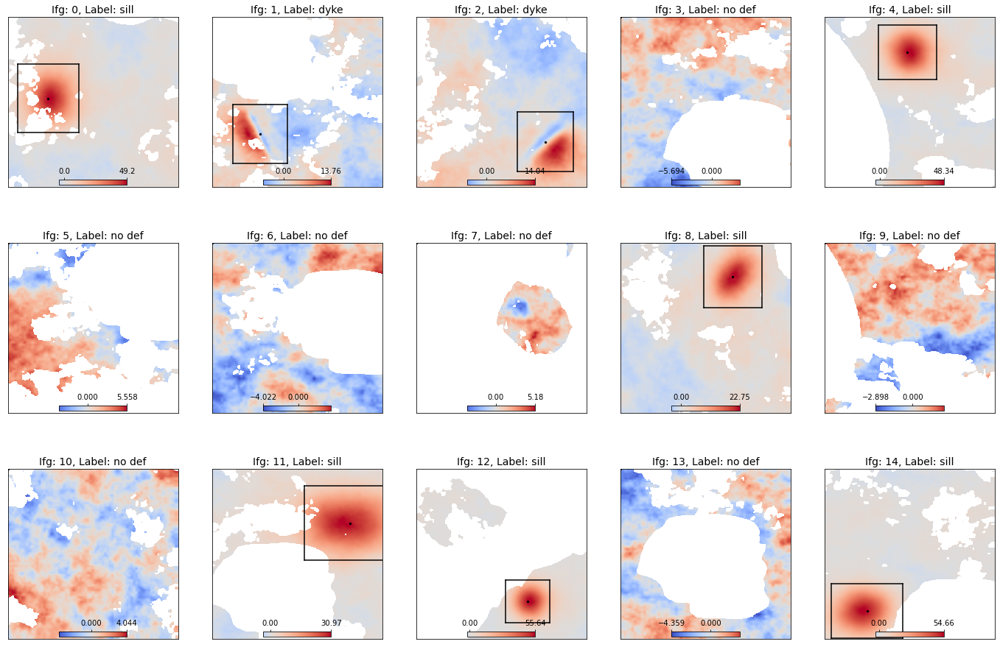

In [8]:
open_datafile_and_plot(f"data/synthetic_data/data_file_0.pkl", n_data = 15, 
                       window_title ='01 Sample of synthetic data')  # open and plot the data in 1 file

In [9]:
#step 03 (load real data and augment):
real_ifg_settings       = {'augmentation_factor' : 3}   # factor to auument by.  E.g. if set to 10 and there are 30 data, there will be 300 augmented data. 
print("\nStep 03: Loading augmented real interferograms from VolcNet")          
real_augmented_files = glob.glob(str(Path(f"./real/augmented/*.pkl")))  


Step 03: Loading augmented real interferograms from VolcNet


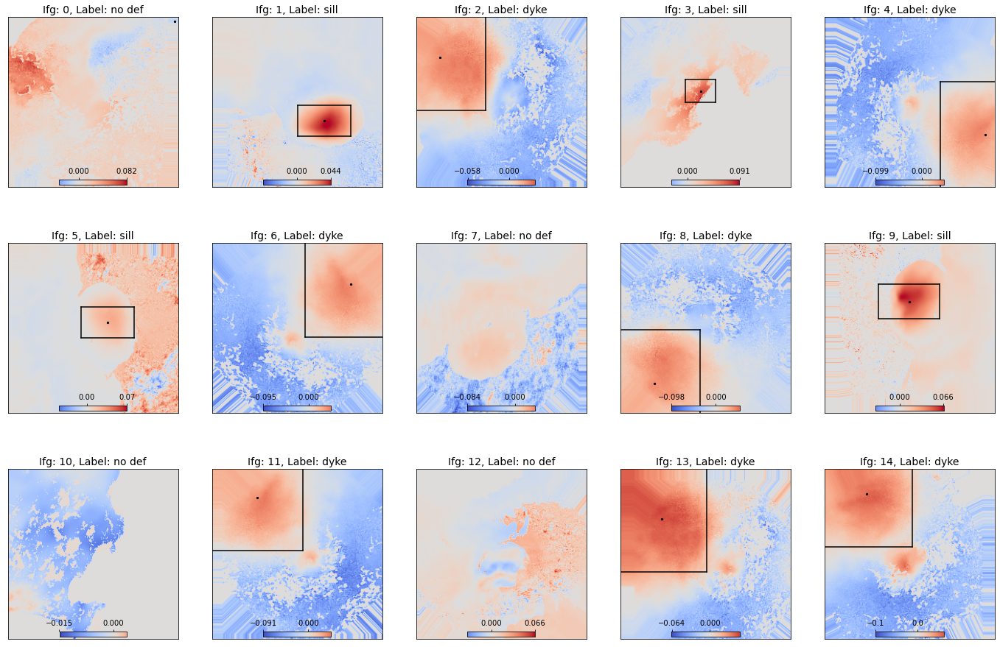

In [10]:
open_datafile_and_plot("./data/real/augmented/data_file_0.pkl", n_data = 15, window_title = '03 Sample of augmented real data')

In [11]:
# step 04 (merge synthetic and real, and rescale to desired range)
cnn_settings = {'input_range'       : {'min':0, 'max':255}}

print("\nStep 04: Mergring the real and synthetic interferograms and rescaling to CNNs input range.")

synthetic_data_files = glob.glob(str(Path(f"./data/synthetic_data/*.pkl")))                     
# get the paths to each file of synthetic data
real_data_files = glob.glob(str(Path(f"./data/real/augmented/*.pkl")))       


Step 04: Mergring the real and synthetic interferograms and rescaling to CNNs input range.


In [12]:
#%%
def expand_to_r4(r2_array, shape = (224,224)):
    """
    Calcaulte something for every image and channel in rank 4 data (e.g. 100x224x224x3 to get 100x3)
    Expand new rank 2 to size of original rank 4 for elemtiwise operations
    """
    import numpy as np
    
    r4_array = r2_array[:, np.newaxis, np.newaxis, :]
    r4_array = np.repeat(r4_array, shape[0], axis = 1)
    r4_array = np.repeat(r4_array, shape[1], axis = 2)
    return r4_array

def custom_range_for_CNN(r4_array, min_max, mean_centre = False):
    """ Rescale a rank 4 array so that each channel's image lies in custom range
    e.g. input with range of (-5, 15) is rescaled to (-125 125) or (-1 1) for use with VGG16.  
    Designed for use with masked arrays.  
    Inputs:
        r4_array | r4 masked array | works with masked arrays?  
        min_max | dict | 'min' and 'max' of range desired as a dictionary.  
        mean_centre | boolean | if True, each image's channels are mean centered.  
    Returns:
        r4_array | rank 4 numpy array | masked items are set to zero, rescaled so that each channel for each image lies between min_max limits.  
    History:
        2019/03/20 | now includes mean centering so doesn't stretch data to custom range.  
                    Instead only stretches until either min or max touches, whilst mean is kept at 0
        2020/11/02 | MEG | Update so range can have a min and max, and not just a range
        2021/01/06 | MEG | Upate to work with masked arrays.  Not test with normal arrays.
    """
    import numpy as np
    import numpy.ma as ma
    
    if mean_centre:
        im_channel_means = ma.mean(r4_array, axis = (1,2))                                                  # get the average for each image (in all thre channels)
        im_channel_means = expand_to_r4(im_channel_means, r4_array[0,:,:,0].shape)                                                   # expand to r4 so we can do elementwise manipulation
        r4_array -= im_channel_means                                                                        # do mean centering    


    im_channel_min = ma.min(r4_array, axis = (1,2))                                         # get the minimum of each image and each of its channels
    im_channel_min = expand_to_r4(im_channel_min, r4_array[0,:,:,0].shape)                  # exapnd to rank 4 for elementwise applications
    r4_array -= im_channel_min                                                              # set so lowest channel for each image is 0
    
    im_channel_max = ma.max(r4_array, axis = (1,2))                                         # get the maximum of each image and each of its channels
    im_channel_max = expand_to_r4(im_channel_max, r4_array[0,:,:,0].shape)              # make suitable for elementwise applications
    r4_array /= im_channel_max                                                              # should now be in range [0, 1]
    
    r4_array *= (min_max['max'] - min_max['min'])                                           # should now be in range [0, new max-min]
    r4_array += min_max['min']                                                              # and now in range [new min, new max]        
    r4_nparray = r4_array.filled(fill_value = 0)                                            # convert to numpy array, maksed incoherent areas are set to zero.  
    

    return r4_nparray 
def merge_and_rescale_data(synthetic_data_files, real_data_files, output_range = {'min':0, 'max':225}):
    """ Given a list of synthetic data files and real data files (usually the augmented real data),
    
    Inputs:
        synthetic_data_files | list of Paths or string | locations of the .pkl files containing the masked arrays
        reak_data_files      | list of Paths or string | locations of the .pkl files containing the masked arrays
        output_range         | dict                    | min and maximum of each channel in each image.  Should be set to suit the CNN being used.  
    Returns:
        .npz files in step_04_merged_rescaled_data
    History:
        2020_10_29 | MEG | Written
        2021_01_06 | MEG | Fix bug in that mixed but not rescaled data was being written to the numpy arrays.  
    """  
    def data_channel_checker(X, n_cols = None, window_title = None):
        """ Plot some of the data in X.   All three channels are shown.  
        """      
        if n_cols == None:       # if n_cols is None, we'll plot all the data
            n_cols = X.shape[0]   # so n_cols is the number of data
            plot_args = np.arange(0, n_cols) # and we'll be plotting each of them
        else:
            plot_args = np.random.randint(0, X.shape[0], n_cols)        # else, pick some at random to plot
        f, axes = plt.subplots(3,n_cols)
        if window_title is not None:
            f.canvas.set_window_title(window_title)
        for plot_n, im_n in enumerate(plot_args):                           # loop through each data (column)               
            axes[0, plot_n].set_title(f"Data: {im_n}")
            for channel_n in range(3):                                      # loop through each row
                axes[channel_n, plot_n].imshow(X[im_n, :,:,channel_n])
                if plot_n == 0:
                    axes[channel_n, plot_n].set_ylabel(f"Channel {channel_n}")

    if len(synthetic_data_files) != len(real_data_files):
        raise Exception('This funtion is only designed to be used when the number of real and synthetic data files are the same.  Exiting.  ')

    n_files = len(synthetic_data_files)        
    out_file = 0
    for n_file in range(n_files):
        print(f'    Opening and merging file {n_file} of each type... ', end = '')
        with open(real_data_files[n_file], 'rb') as f:       # open the real data file
            X_real = pickle.load(f)
            Y_class_real = pickle.load(f)
            Y_loc_real = pickle.load(f)
        f.close()    
        
        with open(synthetic_data_files[n_file], 'rb') as f:       # open the synthetic data file
            X_synth = pickle.load(f)
            Y_class_synth = pickle.load(f)
            Y_loc_synth = pickle.load(f)
        f.close()    

        X = ma.concatenate((X_real, X_synth), axis = 0)        # concatenate the data
        Y_class = ma.concatenate((Y_class_real, Y_class_synth), axis = 0)    # and the class labels
        Y_loc = ma.concatenate((Y_loc_real, Y_loc_synth), axis = 0)        # and the location labels
        
        mix_index = np.arange(0, X.shape[0])          # mix them, get a lis of arguments for each data 
        np.random.shuffle(mix_index)            # shuffle the arguments
        X = X[mix_index,]               # reorder the data using the shuffled arguments
        Y_class = Y_class[mix_index]     # reorder the class labels
        Y_loc = Y_loc[mix_index]      # and the location labels

        X_rescale = custom_range_for_CNN(X, output_range, mean_centre = False)  # resacle the data from metres/rads etc. to desired input range of cnn (e.g. [0, 255]), and convert to numpy array
                
        data_mid = int(X_rescale.shape[0] / 2)                                                                                                                          # data before this number in one file, and after in another
        np.savez(f'data/merged_out/data_file_{out_file}.npz', X = X_rescale[:data_mid,:,:,:], Y_class= Y_class[:data_mid,:], Y_loc = Y_loc[:data_mid,:])           # save the first half of the data
        out_file += 1                                                                                                                                                   # after saving once, update
        np.savez(f'data/merged_out/data_file_{out_file}.npz', X = X_rescale[data_mid:,:,:,:], Y_class= Y_class[data_mid:,:], Y_loc = Y_loc[data_mid:,:])           # save the second half of the data
        out_file += 1                                                                                                                                                   # and after saving again, update again.  
        print('Done.  ')
        

    Opening and merging file 0 of each type... Done.  
    Opening and merging file 1 of each type... Done.  
    Opening and merging file 2 of each type... Done.  
    Opening and merging file 3 of each type... Done.  
    Opening and merging file 4 of each type... Done.  
    Opening and merging file 5 of each type... Done.  
    Opening and merging file 6 of each type... Done.  
    Opening and merging file 7 of each type... Done.  
    Opening and merging file 8 of each type... Done.  
    Opening and merging file 9 of each type... Done.  
    Opening and merging file 10 of each type... Done.  
    Opening and merging file 11 of each type... Done.  
    Opening and merging file 12 of each type... Done.  


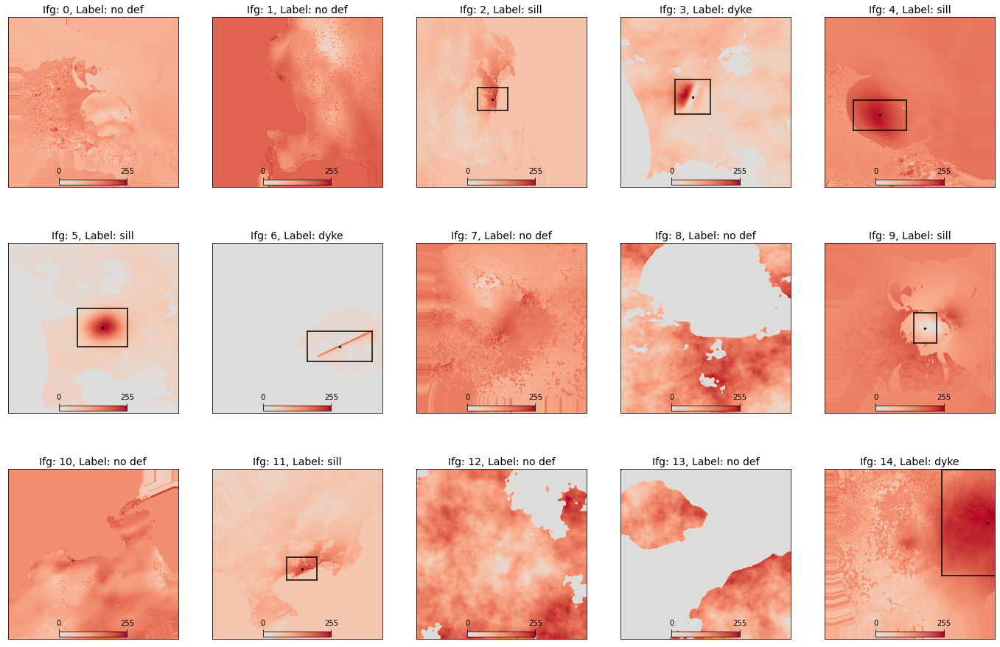

In [13]:
# get the paths to each file of real data
merge_and_rescale_data(synthetic_data_files, real_data_files, cnn_settings['input_range'])                                   # merge the real and synthetic data, and rescale it into the correct range for use with the CNN

open_datafile_and_plot("./data/merged_out/data_file_0.npz", n_data = 15,
                       window_title = ' 04 Sample of merged and rescaled data')

<hr>


<div style="background-color: #e6ccff; padding: 10px;">
    
<h1> Bottle neck </h1>

</div>    
  

<div style="background-color: #cce5ff; padding: 10px;">

this uses the keras VGG16 module which if the machine you are using has GPU's will automatically use. 
    
    
If the machine you are using does not have GPUS then 

    
The below segment of code may take a while if running on your laptop, if this is going to take to long then set
    
```python
UsePreMadeBottlenecks = True

```
</div>

In [18]:
UsePreMadeBottlenecks = False

In [19]:
# step 05 (compute bottleneck features): 
vgg16_block_1to5 = VGG16(weights='imagenet', include_top=False, input_shape = (224,224,3))     

# load the first 5 (convolutional) blocks of VGG16 and their weights.  
data_out_files = sorted(glob.glob(f'data/merged_out/*.npz'))       

if UsePreMadeBottlenecks is False:
    bottleneck_folder = 'bottleneck_out'
    # get a list of the files output by step 05 (augmented real data and synthetic data mixed and 
    # rescaed to correct range, with 0s for masked areas.  )
    for file_n, data_out_file in enumerate(data_out_files):   
        # loop through each of the step 05 files.  
        print(f'Bottlneck file {file_n}:') 
        data_out_file = Path(data_out_file)                                                                                     # convert to path 
        bottleneck_file_name = data_out_file.parts[-1].split('.')[0]                                                            # and get last part which is filename    
        data = np.load(data_out_file)                                                                                           # load the numpy file
        X = data['X']                                                                                                           # extract the data for it
        Y_class = data['Y_class']                                                                                               # and class labels.  
        Y_loc = data['Y_loc']                                                                                                   # and location labels.  
        X_btln = vgg16_block_1to5.predict(X, verbose = 1)      
        # predict up to bottleneck    
        np.savez(f'data/{bottleneck_folder}/{bottleneck_file_name}_bottleneck.npz', 
                 X = X_btln, Y_class = Y_class, Y_loc = Y_loc)   
        # save the bottleneck file, and the two types of label.
else:
    print('using premade bottleneck files')
    bottleneck_folder = 'bottleneck_provided'


Bottlneck file 0:
2/2 [==============================] - 2s 669ms/step
Bottlneck file 1:
2/2 [==============================] - 2s 742ms/step
Bottlneck file 2:
2/2 [==============================] - 2s 722ms/step
Bottlneck file 3:
2/2 [==============================] - 2s 779ms/step
Bottlneck file 4:
2/2 [==============================] - 2s 734ms/step
Bottlneck file 5:
2/2 [==============================] - 2s 748ms/step
Bottlneck file 6:
2/2 [==============================] - 2s 713ms/step
Bottlneck file 7:
2/2 [==============================] - 2s 678ms/step
Bottlneck file 8:
2/2 [==============================] - 2s 617ms/step
Bottlneck file 9:
2/2 [==============================] - 2s 745ms/step
Bottlneck file 10:
2/2 [==============================] - 2s 661ms/step
Bottlneck file 11:
2/2 [==============================] - 2s 677ms/step
Bottlneck file 12:
2/2 [==============================] - 2s 824ms/step
Bottlneck file 13:
2/2 [==============================] - 2s 773ms/step
Bo

<div style="background-color: #e6ccff; padding: 10px;">
    
<h1> Training the Neural Network </h1>

</div>    

<div style="background-color: #cce5ff; padding: 10px;">
First we need two fuctions to divide the list in 
    
</div>

In [ ]:
def file_list_divider(file_list, n_files_train, n_files_validate, n_files_test):
    """ Given a list of files, divide it up into training, validating, and testing lists.  
    Inputs
        file_list | list | list of files
        n_files_train | int | Number of files to be used for training
        n_files_validate | int | Number of files to be used for validation (during training)
        n_files_test | int | Number of files to be used for testing
    Returns:
        file_list_train | list | list of training files
        file_list_validate | list | list of validation files
        file_list_test | list | list of testing files
    History:
        2019/??/?? | MEG | Written
        2020/11/02 | MEG | Write docs
        """
    file_list_train = file_list[:n_files_train]
    file_list_validate = file_list[n_files_train:(n_files_train+n_files_validate)]
    file_list_test = file_list[(n_files_train+n_files_validate) : (n_files_train+n_files_validate+n_files_test)]
    return file_list_train, file_list_validate, file_list_test

def file_merger(files): 
    """Given a list of files, open them and merge into one array.  
    Inputs:
        files | list | list of paths to the .npz files
    Returns
        X | r4 array | data
        Y_class | r2 array | class labels, ? x n_classes
        Y_loc | r2 array | locations of signals, ? x 4 (as x,y, width, heigh)
    History:
        2020/10/?? | MEG | Written
        2020/11/11 | MEG | Update to remove various input arguments
    
    """
    
    def open_synthetic_data_npz(name_with_path):
        """Open a file data file """  
        data = np.load(name_with_path)
        X = data['X']
        Y_class = data['Y_class']
        Y_loc = data['Y_loc']
        return X, Y_class, Y_loc

    n_files = len(files)
    
    for i, file in enumerate(files):
        X_batch, Y_class_batch, Y_loc_batch = open_synthetic_data_npz(file)
        if i == 0:
            n_data_per_file = X_batch.shape[0]
            X = np.zeros((n_data_per_file * n_files, X_batch.shape[1], X_batch.shape[2], X_batch.shape[3]))   # initate array, rank4 for image, get the size from the first file
            Y_class = np.zeros((n_data_per_file  * n_files, Y_class_batch.shape[1]))       # should be flexible with class labels or one hot encoding
            Y_loc = np.zeros((n_data_per_file * n_files, 4))    # four columns for bounding box
            
        
        X[i*n_data_per_file:(i*n_data_per_file)+n_data_per_file,:,:,:] = X_batch
        Y_class[i*n_data_per_file:(i*n_data_per_file)+n_data_per_file,:] = Y_class_batch
        Y_loc[i*n_data_per_file:(i*n_data_per_file)+n_data_per_file,:] = Y_loc_batch
    
    return X, Y_class, Y_loc 

def define_two_head_model(model_input, n_class_outputs = 3):
    """ Define the two headed model that we have designed to performed classification and localisation.  
    Inputs:
        model_input | tensorflow.python.framework.ops.Tensor | The shape of the tensor that will be input to our model.  Usually the output of VGG16 (?x7x7x512)  Nb ? = batch size.  
        n_class_output | int | For a one hot encoding style output, there must be as many neurons as classes
    Returns:
        output_class |tensorflow.python.framework.ops.Tensor | The shape of the tensor output by the classifiction head.  Usually ?x3
        output_loc | tensorflow.python.framework.ops.Tensor | The shape of the tensor output by the localisation head.  Usually ?x4
    History:
        2020_11_11 | MEG | Written
    """
    from keras.layers import Dense, Dropout, Flatten
    
    vgg16_block_1to5_flat = Flatten(name = 'vgg16_block_1to5_flat')(model_input)                              # flatten the model input (ie deep representation turned into a column vector)

    # 1: the clasification head
    x = Dropout(0.2, name='class_dropout1')(vgg16_block_1to5_flat)
    x = Dense(256, activation='relu', name='class_dense1')(x)                                                 # add a fully connected layer
    x = Dropout(0.2, name='class_dropout2')(x)
    x = Dense(128, activation='relu', name='class_dense2')(x)                                                 # add a fully connected layer
    output_class = Dense(n_class_outputs, activation='softmax',  name = 'class_dense3')(x)                  # and an ouput layer with 7 outputs (ie one per label)
    
    # 2: the localization head
    x = Dense(2048, activation='relu', name='loc_dense1')(vgg16_block_1to5_flat)                                                 # add a fully connected layer
    x = Dense(1024, activation='relu', name='loc_dense2')(x)                                                 # add a fully connected layer
    x = Dense(1024, activation='relu', name='loc_dense3')(x)                                                 # add a fully connected layer
    x = Dropout(0.2, name='loc_dropout1')(x)
    x = Dense(512, activation='relu', name='loc_dense4')(x)                                                 # add a fully connected layer
    x = Dense(128, activation='relu', name='loc_dense5')(x)                                                 # add a fully connected layer
    output_loc = Dense(4, name='loc_dense6')(x)        
    
    return output_class, output_loc

In [10]:
def train_double_network(model, files, n_epochs, loss_names,
                                    X_validate, Y_class_validate, Y_loc_validate, n_classes):
    """Train a double headed model using training data stored in separate files.  
    Inputs:
        model | keras model | the model to be trained
        files | list | list of paths and filenames for the files used during training
        n_epochs | int | number of epochs to train for
        loss names | list | names of outputs of losses (e.g. "class_dense3_loss)
    Returns
        model | keras model | updated by the fit process
        metrics_loss | r2 array | columns are: total loss/class loss/loc loss /validate total loss/validate class loss/ validate loc loss
        metrics_class | r2 array | columns are class accuracy, validation class accuracy
        
    2019/03/25 | Written.  
    """
    import numpy as np
    import keras
    
    n_files_train = len(files)                                                              # get the number of training files
    
    metrics_class = np.zeros((n_files_train*n_epochs, 2))                                    # train class acuracy, valiate class accuracy
    metrics_loss = np.zeros((n_files_train*n_epochs, 6))                                     # total loss/class loss/loc loss /validate total loss/validate class loss/ validate loc loss
    
    for e in range(n_epochs):                                                                        # loop through the number of epochs
        for file_num, file in enumerate(files):                                   # for each epoch, loop through all files once
        
            data = np.load(file)
            X_batch = data['X']
            Y_batch_class = data['Y_class']
            Y_batch_loc = data['Y_loc']
            
            if n_classes !=  Y_batch_class.shape[1]:
                Y_batch_class = keras.utils.to_categorical(Y_batch_class, n_classes, dtype='float32')       # convert to one hot encoding (from class labels)
                
    
            history_train_temp = model.fit(X_batch, [Y_batch_class, Y_batch_loc], batch_size=32, epochs=1, verbose = 0)
             
            metrics_loss[(e*n_files_train)+file_num, 0] = history_train_temp.history['loss'][0]                        # main los    
            metrics_loss[(e*n_files_train)+file_num, 1] = history_train_temp.history[loss_names[0]][0]                 # class loss
            metrics_loss[(e*n_files_train)+file_num, 2] = history_train_temp.history[loss_names[1]][0]                 # localization loss
            metrics_class[(e*n_files_train)+file_num, 0] = history_train_temp.history['class_dense3_accuracy'][0]           # classification accuracy        
            print(f'Epoch {e}, file {file_num}: Loss = {round(metrics_loss[(e*n_files_train)+file_num, 0],0)}, '
                                       f'Class. loss = {round(metrics_loss[(e*n_files_train)+file_num, 1],2)}, '
                                       f'Class. acc. = {round(metrics_class[(e*n_files_train)+file_num, 0],2)}, '
                                         f'Loc. loss = {round(metrics_loss[(e*n_files_train)+file_num, 2],0)}')
            
            
            
            
        history_validate_temp = model.evaluate(X_validate, [Y_class_validate, Y_loc_validate], batch_size = 32, verbose = 0)
        metrics_loss[(e*n_files_train)+file_num, 3] = history_validate_temp[0]                                          # main loss
        metrics_loss[(e*n_files_train)+file_num, 4] = history_validate_temp[1]                                          # class loss
        metrics_loss[(e*n_files_train)+file_num, 5] = history_validate_temp[2]                                          # localisation loss
        metrics_class[(e*n_files_train)+file_num, 1] = history_validate_temp[3]                                         # classification  accuracy
        print(f'Epoch {e}, valid.: Loss = {round(metrics_loss[(e*n_files_train)+file_num, 3],0)}, '
                          f'Class. loss = {round(metrics_loss[(e*n_files_train)+file_num, 4],2)}, '
                          f'Class. acc. = {round(metrics_class[(e*n_files_train)+file_num, 1],2)}, '
                            f'Loc. loss = {round(metrics_loss[(e*n_files_train)+file_num, 5],0)}')
    

    metrics_class = np.hstack((metrics_loss[:,1:2], metrics_loss[:,4:5], metrics_class ))                       # class loss, validate class loss, class accuracy, validate class accuracy
    metrics_localisation = np.hstack((metrics_loss[:,2:3], metrics_loss[:,5:]))                                 # localisation loss, validate localisation loss, localisation accuracy, validate localisation accuracy
    metrics_combined_loss = np.hstack((metrics_loss[:,1:2], metrics_loss[:,3:4]))                               # class accuracy, validate class accuracy
    
    return model, metrics_class, metrics_localisation, metrics_combined_loss

def custom_training_history(metrics, n_epochs, title = None):
    """Plot training line graphs for loss and accuracy.  Loss on the left, accuracy on the right.  
    Inputs
        metrics | r2 array | (n_files * n_epochs) x 2 or 4 matrix,  train loss|validate loss | train accuracy|validate accuracy.  If no accuracy, only 2 columns
        n_epochs | int | number of epochs model was trained for
        title | string | title
    Returns:
        Figure
    """
    import numpy as np
    import matplotlib.pyplot as plt
    
    if metrics.shape[1] == 4:           # detemrine if we have accuracy as well as loss
        accuracy_flag = True
    else:
        accuracy_flag = False
        
    
    n_files = metrics.shape[0] / n_epochs
    # Figure output
    fig1, axes = plt.subplots(1,2)
    fig1.canvas.set_window_title(title)
    fig1.suptitle(title)
    xvals = np.arange(0,metrics.shape[0])
    validation_plot = np.ravel(np.argwhere(metrics[:,1] > 1e-10))                   # fewer validation data; find which ones to plot
    
    axes[0].plot(xvals, metrics[:,0], c = 'k')                                       # training loss
    axes[0].plot(xvals[validation_plot], metrics[validation_plot,1], c = 'r')        # validation loss
    axes[0].set_ylabel('Loss')
    axes[0].legend(['train', 'validate'], loc='upper left')
    axes[0].axhline(y=0, color='k', alpha=0.5)
    
    if accuracy_flag:
        axes[1].plot(xvals, metrics[:,2], c = 'k')                                       # training accuracy
        axes[1].plot(xvals[validation_plot], metrics[validation_plot,3], c = 'r')        # validation accuracy
        axes[1].set_ylim([0,1])
        axes[1].set_ylabel('Accuracy')
        axes[1].yaxis.tick_right()
        axes[1].legend(['train', 'validate'], loc='upper right')
        
    #
    titles = ['Training loss', 'Training accuracy']
    for i in range(2):
        axes[i].set_title(titles[i])
        axes[i].set_xticks(np.arange(0,metrics.shape[0],2*n_files))                 # change so a tick only after each epoch (and not each file)
        axes[i].set_xticklabels(np.arange(0,n_epochs, 2))                                  # number ticks
        axes[i].set_xlabel('Epoch number')

    if not accuracy_flag:
        axes[1].set_visible(False)

    There are 26 data files.  22 will be used for training,2 for validation, and 2 for testing.  
Epoch 0, file 0: Loss = 8709.0, Class. loss = 14.64, Class. acc. = 0.26, Loc. loss = 9167.0
Epoch 0, file 1: Loss = 8479.0, Class. loss = 6.38, Class. acc. = 0.42, Loc. loss = 8925.0
Epoch 0, file 2: Loss = 6305.0, Class. loss = 5.18, Class. acc. = 0.46, Loc. loss = 6636.0
Epoch 0, file 3: Loss = 4710.0, Class. loss = 6.04, Class. acc. = 0.4, Loc. loss = 4957.0
Epoch 0, file 4: Loss = 4131.0, Class. loss = 12.94, Class. acc. = 0.4, Loc. loss = 4347.0
Epoch 0, file 5: Loss = 3432.0, Class. loss = 3.87, Class. acc. = 0.6, Loc. loss = 3612.0
Epoch 0, file 6: Loss = 5882.0, Class. loss = 4.51, Class. acc. = 0.56, Loc. loss = 6191.0
Epoch 0, file 7: Loss = 4030.0, Class. loss = 4.53, Class. acc. = 0.44, Loc. loss = 4242.0
Epoch 0, file 8: Loss = 5112.0, Class. loss = 3.07, Class. acc. = 0.44, Loc. loss = 5381.0
Epoch 0, file 9: Loss = 3616.0, Class. loss = 3.88, Class. acc. = 0.56, Loc. loss = 

Epoch 3, file 20: Loss = 1947.0, Class. loss = 1.86, Class. acc. = 0.84, Loc. loss = 2049.0
Epoch 3, file 21: Loss = 1118.0, Class. loss = 0.46, Class. acc. = 0.9, Loc. loss = 1177.0
Epoch 3, valid.: Loss = 1605.0, Class. loss = 0.8, Class. acc. = 0.88, Loc. loss = 1689.0
Epoch 4, file 0: Loss = 1664.0, Class. loss = 1.01, Class. acc. = 0.9, Loc. loss = 1751.0
Epoch 4, file 1: Loss = 902.0, Class. loss = 0.5, Class. acc. = 0.94, Loc. loss = 949.0
Epoch 4, file 2: Loss = 857.0, Class. loss = 0.24, Class. acc. = 0.96, Loc. loss = 902.0
Epoch 4, file 3: Loss = 1149.0, Class. loss = 0.73, Class. acc. = 0.88, Loc. loss = 1209.0
Epoch 4, file 4: Loss = 1226.0, Class. loss = 0.01, Class. acc. = 1.0, Loc. loss = 1290.0
Epoch 4, file 5: Loss = 816.0, Class. loss = 0.45, Class. acc. = 0.92, Loc. loss = 858.0
Epoch 4, file 6: Loss = 996.0, Class. loss = 0.28, Class. acc. = 0.92, Loc. loss = 1049.0
Epoch 4, file 7: Loss = 860.0, Class. loss = 0.05, Class. acc. = 0.96, Loc. loss = 905.0
Epoch 4, fi

Epoch 7, file 20: Loss = 862.0, Class. loss = 0.03, Class. acc. = 1.0, Loc. loss = 907.0
Epoch 7, file 21: Loss = 619.0, Class. loss = 0.05, Class. acc. = 0.98, Loc. loss = 651.0
Epoch 7, valid.: Loss = 1114.0, Class. loss = 1.37, Class. acc. = 0.85, Loc. loss = 1172.0
Epoch 8, file 0: Loss = 666.0, Class. loss = 1.16, Class. acc. = 0.94, Loc. loss = 701.0
Epoch 8, file 1: Loss = 770.0, Class. loss = 0.37, Class. acc. = 0.94, Loc. loss = 811.0
Epoch 8, file 2: Loss = 516.0, Class. loss = 0.04, Class. acc. = 0.98, Loc. loss = 543.0
Epoch 8, file 3: Loss = 719.0, Class. loss = 0.01, Class. acc. = 1.0, Loc. loss = 757.0
Epoch 8, file 4: Loss = 539.0, Class. loss = 0.05, Class. acc. = 0.98, Loc. loss = 567.0
Epoch 8, file 5: Loss = 852.0, Class. loss = 0.87, Class. acc. = 0.92, Loc. loss = 896.0
Epoch 8, file 6: Loss = 509.0, Class. loss = 0.25, Class. acc. = 0.96, Loc. loss = 536.0
Epoch 8, file 7: Loss = 758.0, Class. loss = 0.0, Class. acc. = 1.0, Loc. loss = 797.0
Epoch 8, file 8: Loss

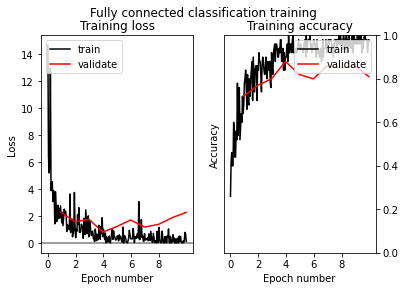

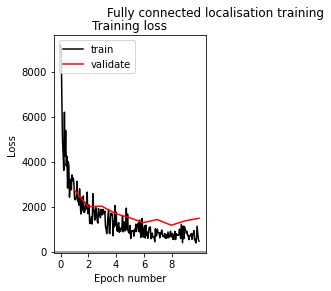

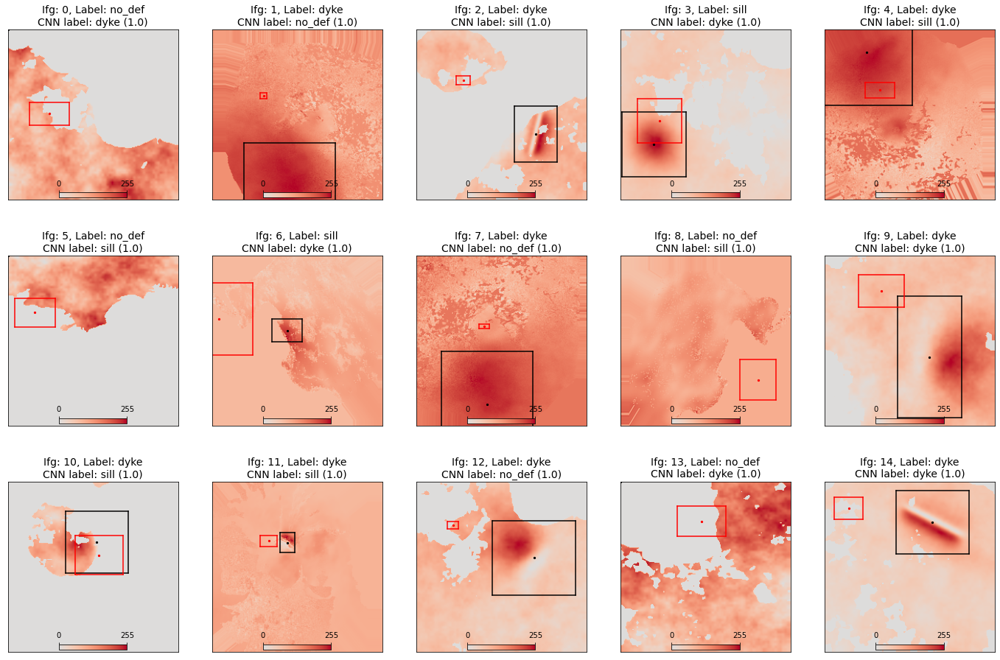

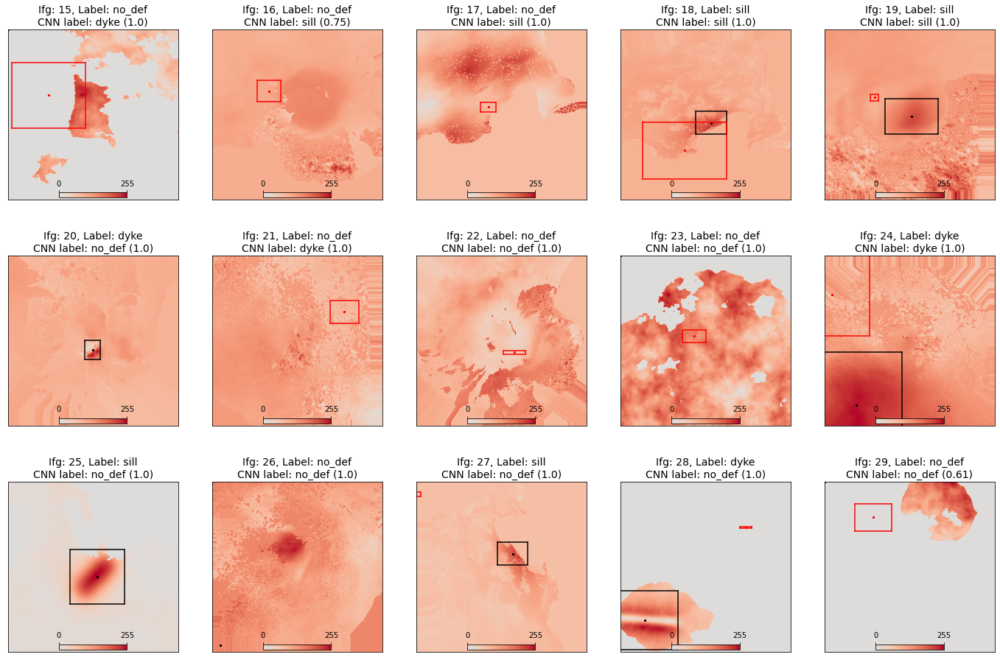

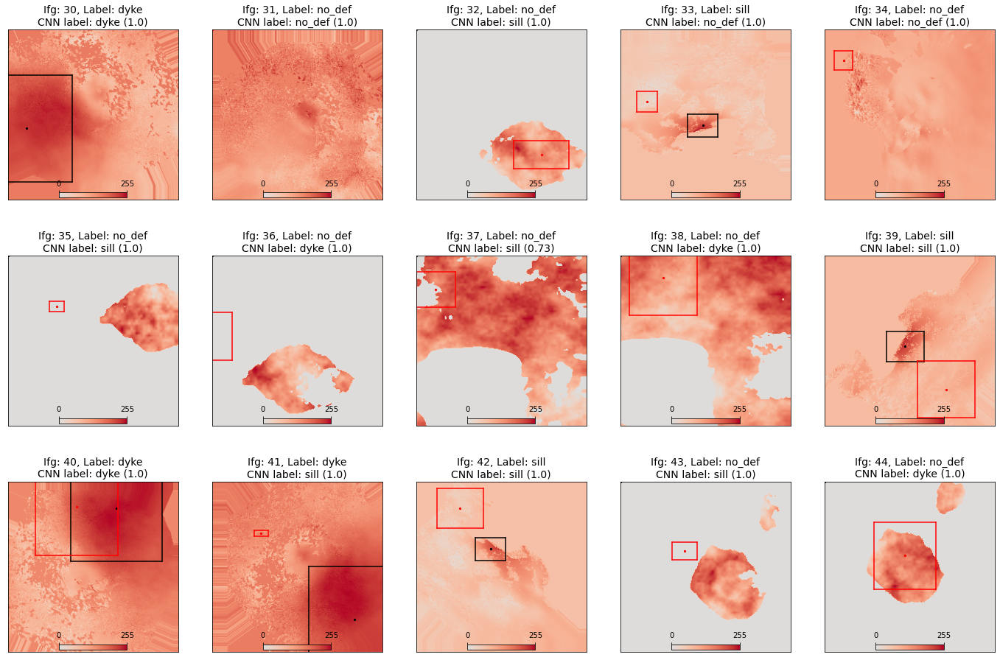

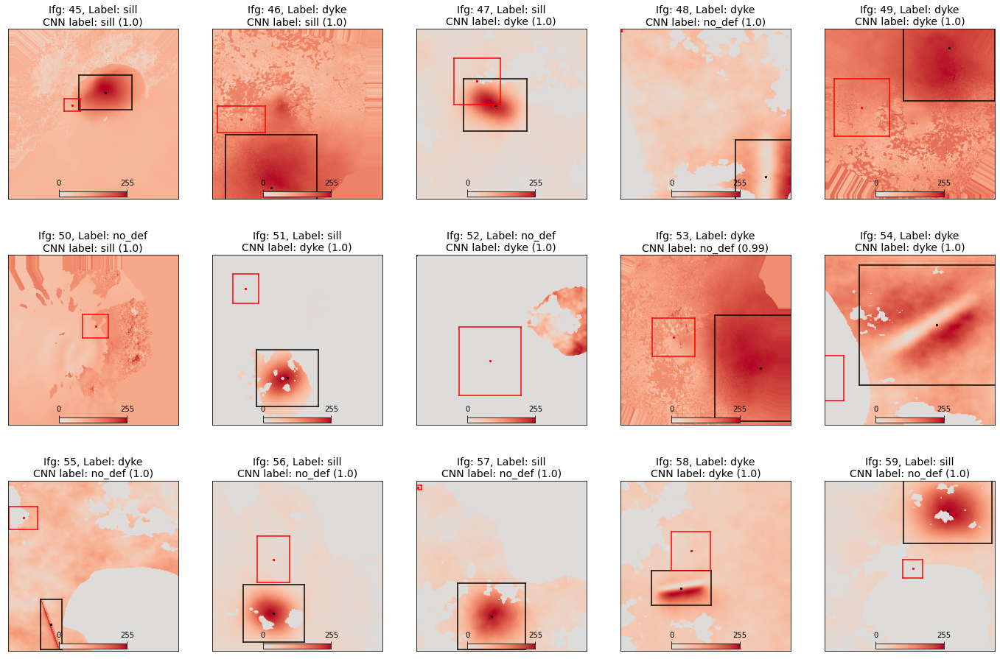

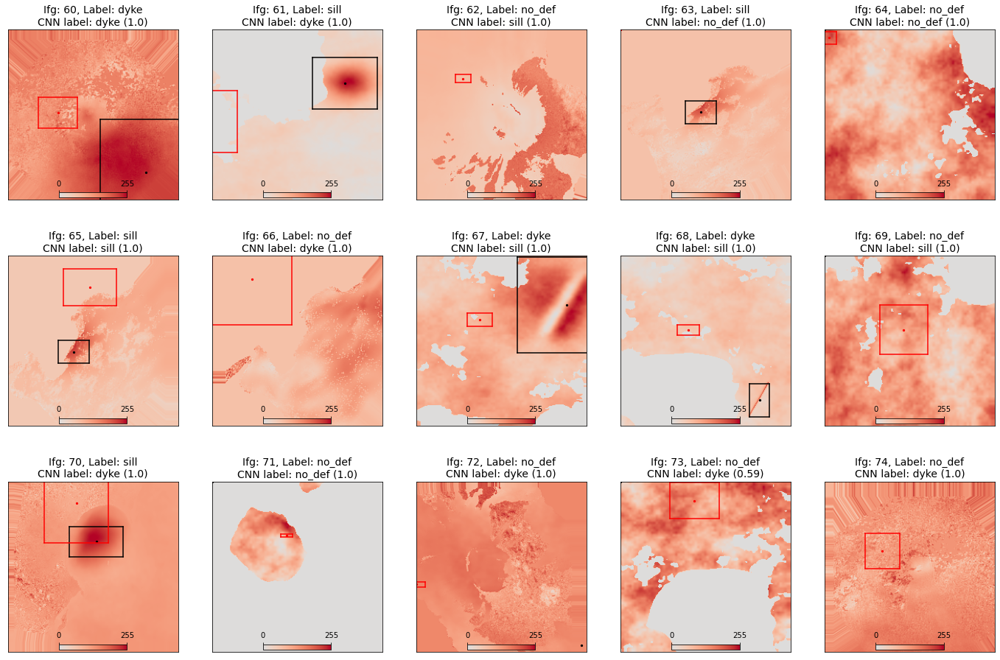

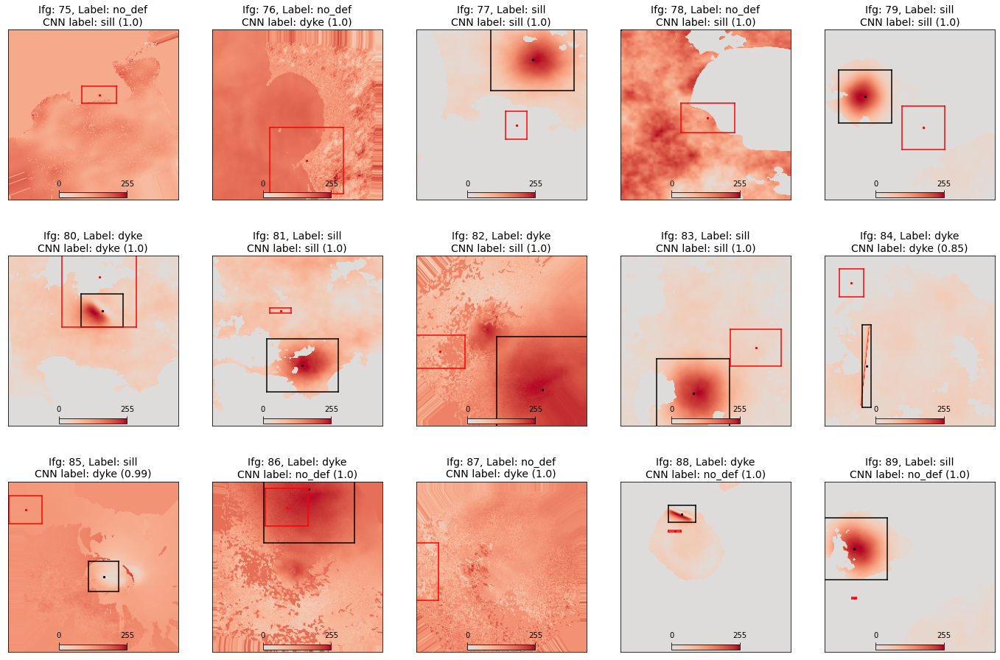

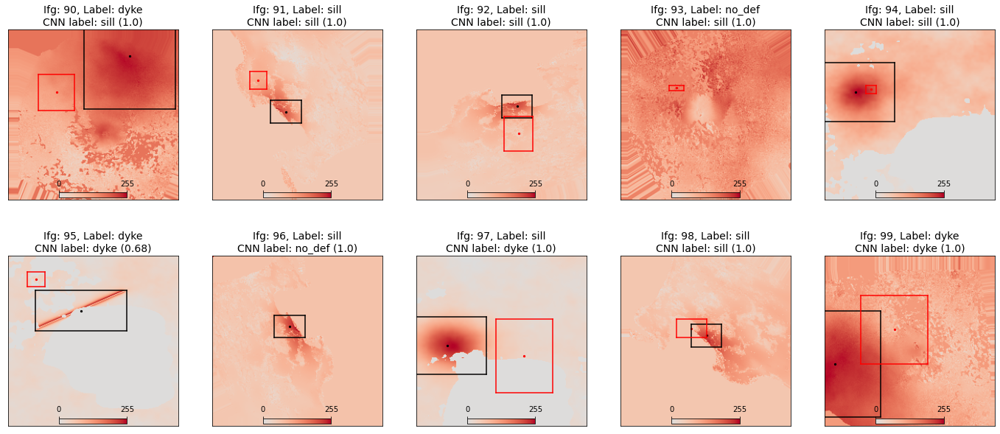

In [12]:
# step 06 (train the fully connected part of the network)
cnn_settings = {'input_range'       : {'min':0, 'max':255}}
cnn_settings['n_files_train']     = 22      # the number of files that will be used to train the network
cnn_settings['n_files_validate']  = 2       # the number of files that wil be used to validate the network (i.e. passed through once per epoch)
cnn_settings['n_files_test']      = 2       # the number of files held back for testing.  
fc_loss_weights = [0.05, 0.95]              # the relative weighting of the two losses (classificaiton and localisation) to contribute to the global loss.  Classification first, localisation second.  
n_epochs_fc = 10   # the number of epochs to train the fully connected network for 
# (ie. the number of times all the training data are passed through the model)
data_files = sorted(glob.glob(f'data/merged_out/*npz'), key = os.path.getmtime)    # make list of data files
# and make a list of bottleneck files (ie files that have been passed through the first 5 blocks of vgg16)
bottleneck_files = sorted(glob.glob(f'data/bottleneck_out/*npz'), key = os.path.getmtime) 
if len(data_files) < (cnn_settings['n_files_train'] + cnn_settings['n_files_validate'] + cnn_settings['n_files_test']):
    raise Exception(f"There are {len(data_files)} data files, but {cnn_settings['n_files_train']} have been selected for training, "
                    f"{cnn_settings['n_files_validate']} for validation, and {cnn_settings['n_files_test']} for testing, "
                    f"which sums to greater than the number of data files.  Perhaps adjust the number of files used for the training stages? "
                    f"For now, exiting.")

data_files_train, data_files_validate, data_files_test = file_list_divider(data_files, cnn_settings['n_files_train'], cnn_settings['n_files_validate'], cnn_settings['n_files_test'])                              # divide the files into train, validate and test
bottleneck_files_train, bottleneck_files_validate, bottleneck_files_test = file_list_divider(bottleneck_files, cnn_settings['n_files_train'], cnn_settings['n_files_validate'], cnn_settings['n_files_test'])      # also divide the bottleneck files

X_validate, Y_class_validate, Y_loc_validate      = file_merger(data_files_validate)                             # Open all the validation data to RAM
X_validate_btln, Y_class_validate, Y_loc_validate = file_merger(bottleneck_files_validate)                       # Open the validation data bottleneck features to RAM
X_test, Y_class_test, Y_loc_test                  = file_merger(data_files_test)                                 # Open the test data to RAM
X_test_btln, Y_class_test_btln, Y_loc_test_btln   = file_merger(bottleneck_files_test)                           # Open the test data bottleneck features to RAM

print(f"    There are {len(data_files)} data files.  {len(data_files_train)} will be used for training,"         # print to terminal status on how many files will be used etc.  
      f"{len(data_files_validate)} for validation, and {len(data_files_test)} for testing.  ")

# 6.2 define, compile, and train the model
vgg16_block_1to5 = VGG16(weights='imagenet', include_top=False, input_shape = (224,224,3))                        # VGG16 is used for its convolutional layers and weights (but no fully connected part as we define out own )
fc_model_input = Input(shape = vgg16_block_1to5.output_shape[1:])                                                 # the input to the fully connected model must be the same shape as the output of the 5th block of vgg16
output_class, output_loc = define_two_head_model(fc_model_input, len(synthetic_ifgs_settings['defo_sources']))    # build the full connected part of the model, and get the two model outputs
vgg16_2head_fc = Model(inputs=fc_model_input, outputs=[output_class, output_loc])                                 # define the model.  Input is the shape of vgg16 block 1 to 5 output, and there are two outputs (hence list)                                
plot_model(vgg16_2head_fc, to_file=f'data/train_fully_connected_model/vgg16_2head_fc.png',                     # also plot the model.  This funtcion is known to be fragile due to Graphviz dependencies.  
           show_shapes = True, show_layer_names = True)

loss_class = losses.categorical_crossentropy                                                                      # good loss to use for classification problems, may need to switch to binary if only two classes though?
loss_loc = losses.mean_squared_error                                                                              # loss for localisation
opt_used = optimizers.Nadam(clipnorm = 1., clipvalue = 0.5)                                                       # adam with Nesterov accelerated gradient
vgg16_2head_fc.compile(optimizer = opt_used, loss=[loss_class, loss_loc],                                         # compile the model
                       loss_weights = fc_loss_weights, metrics=['accuracy'])                                      # accuracy is useful to have on the terminal during training

vgg16_2head_fc,  metrics_class_fc, metrics_localisation_fc, metrics_combined_loss_fc = train_double_network(vgg16_2head_fc, bottleneck_files_train,
                                                                                                            n_epochs_fc, ['class_dense3_loss', 'loc_dense6_loss'],
                                                                                                            X_validate_btln, Y_class_validate, Y_loc_validate, len(synthetic_ifgs_settings['defo_sources']))

custom_training_history(metrics_class_fc, n_epochs_fc, title = 'Fully connected classification training')          # plot of the training process for classification
custom_training_history(metrics_localisation_fc, n_epochs_fc, title = 'Fully connected localisation training')     # plot of the training process for localisation
vgg16_2head_fc.save_weights(f'data/train_fully_connected_model/vgg16_2head_fc.h5')   
# save the weights of the model we have trained

# 6.3 Test the model
Y_class_test_cnn, Y_loc_test_cnn = vgg16_2head_fc.predict(X_test_btln, verbose = 1)                                # forward pass of the testing data bottleneck features through the fully connected part of the model
plot_data_class_loc_caller(X_test, classes = Y_class_test, classes_predicted = Y_class_test_cnn,                    # plot all the testing data
                           locs = Y_loc_test, locs_predicted = Y_loc_test_cnn, 
                           source_names = synthetic_ifgs_settings['defo_sources'], 
                           window_title = 'Testing data (after step 06)')




Fine-tuning the 5th convolutional block and the fully connected network.
Epoch 0, file 0: Loss = 769.0, Class. loss = 0.08, Class. acc. = 0.96, Loc. loss = 809.0
Epoch 0, file 1: Loss = 494.0, Class. loss = 0.43, Class. acc. = 0.98, Loc. loss = 520.0
Epoch 0, file 2: Loss = 320.0, Class. loss = 0.25, Class. acc. = 0.98, Loc. loss = 336.0
Epoch 0, file 3: Loss = 986.0, Class. loss = 0.57, Class. acc. = 0.94, Loc. loss = 1038.0
Epoch 0, file 4: Loss = 789.0, Class. loss = 0.01, Class. acc. = 1.0, Loc. loss = 831.0
Epoch 0, file 5: Loss = 453.0, Class. loss = 0.2, Class. acc. = 0.94, Loc. loss = 477.0
Epoch 0, file 6: Loss = 1014.0, Class. loss = 1.54, Class. acc. = 0.8, Loc. loss = 1067.0
Epoch 0, file 7: Loss = 1425.0, Class. loss = 2.35, Class. acc. = 0.78, Loc. loss = 1500.0
Epoch 0, file 8: Loss = 2036.0, Class. loss = 1.99, Class. acc. = 0.84, Loc. loss = 2143.0
Epoch 0, file 9: Loss = 2679.0, Class. loss = 3.03, Class. acc. = 0.72, Loc. loss = 2820.0
Epoch 0, file 10: Loss = 1066

Epoch 3, valid.: Loss = 5789.0, Class. loss = 32.86, Class. acc. = 0.32, Loc. loss = 6092.0
Epoch 4, file 0: Loss = 504.0, Class. loss = 3.8, Class. acc. = 0.82, Loc. loss = 530.0
Epoch 4, file 1: Loss = 345.0, Class. loss = 2.46, Class. acc. = 0.88, Loc. loss = 363.0
Epoch 4, file 2: Loss = 243.0, Class. loss = 2.49, Class. acc. = 0.84, Loc. loss = 256.0
Epoch 4, file 3: Loss = 224.0, Class. loss = 2.05, Class. acc. = 0.84, Loc. loss = 235.0
Epoch 4, file 4: Loss = 274.0, Class. loss = 3.67, Class. acc. = 0.82, Loc. loss = 288.0
Epoch 4, file 5: Loss = 192.0, Class. loss = 0.75, Class. acc. = 0.88, Loc. loss = 202.0
Epoch 4, file 6: Loss = 333.0, Class. loss = 0.99, Class. acc. = 0.86, Loc. loss = 351.0
Epoch 4, file 7: Loss = 528.0, Class. loss = 3.8, Class. acc. = 0.8, Loc. loss = 555.0
Epoch 4, file 8: Loss = 518.0, Class. loss = 1.25, Class. acc. = 0.88, Loc. loss = 545.0
Epoch 4, file 9: Loss = 655.0, Class. loss = 3.05, Class. acc. = 0.8, Loc. loss = 689.0
Epoch 4, file 10: Loss

Epoch 7, valid.: Loss = 6456.0, Class. loss = 26.72, Class. acc. = 0.29, Loc. loss = 6794.0
Epoch 8, file 0: Loss = 384.0, Class. loss = 2.03, Class. acc. = 0.76, Loc. loss = 404.0
Epoch 8, file 1: Loss = 267.0, Class. loss = 3.48, Class. acc. = 0.82, Loc. loss = 281.0
Epoch 8, file 2: Loss = 298.0, Class. loss = 1.04, Class. acc. = 0.9, Loc. loss = 314.0
Epoch 8, file 3: Loss = 633.0, Class. loss = 1.67, Class. acc. = 0.82, Loc. loss = 667.0
Epoch 8, file 4: Loss = 264.0, Class. loss = 3.67, Class. acc. = 0.88, Loc. loss = 277.0
Epoch 8, file 5: Loss = 176.0, Class. loss = 1.38, Class. acc. = 0.86, Loc. loss = 185.0
Epoch 8, file 6: Loss = 188.0, Class. loss = 1.24, Class. acc. = 0.86, Loc. loss = 197.0
Epoch 8, file 7: Loss = 208.0, Class. loss = 2.17, Class. acc. = 0.78, Loc. loss = 219.0
Epoch 8, file 8: Loss = 265.0, Class. loss = 1.16, Class. acc. = 0.82, Loc. loss = 279.0
Epoch 8, file 9: Loss = 426.0, Class. loss = 2.72, Class. acc. = 0.82, Loc. loss = 448.0
Epoch 8, file 10: L

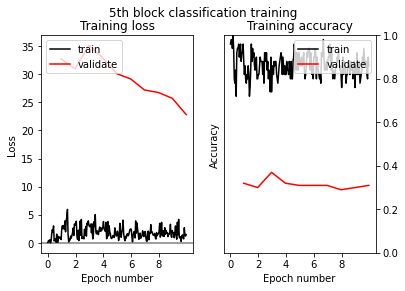

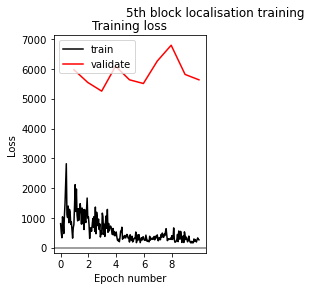

In [37]:
# step 07 (fine-tune the 5th block and the fully connected part of the network):
block5_loss_weights = [0.05, 0.95]  # as per fc_loss_weights, but by changing these more emphasis can be placed on either the clasification or localisation loss.  
#block5_lr = 1.5e-8                 # a pretty important parameter.  We have to set a learning rate manually as an adaptive approach (e.g. NADAM) will be high initially, and therefore make large updates that will wreck the model (as we're just fine-tuning a model so have something good to start with)
block5_lr = 1.0e-6                  # a pretty important parameter.  We have to set a learning rate manually as an adaptive approach (e.g. NADAM) will be high initially, and therefore make large updates that will wreck the model (as we're just fine-tuning a model so have something good to start with)
n_epochs_block5 = 10                # the number of epochs to fine-tune for (ie. the number of times all the training data are passed through the model)

   
np.random.seed(0)                   # 0 used in the example
              
#%% Step 07: Fine-tune the 5th convolutional block and the fully connected network.  

vgg16_block_1to5 = VGG16(weights='imagenet', include_top=False, input_shape = (224,224,3))                                       # VGG16 is used for its convolutional layers and weights (but no fully connected part as we define out own )
output_class, output_loc = define_two_head_model(vgg16_block_1to5.output, len(synthetic_ifgs_settings['defo_sources']))          # build the fully connected part of the model, and get the two model outputs

vgg16_2head = Model(inputs=vgg16_block_1to5.input, outputs=[output_class, output_loc])                                           # define the full model
vgg16_2head.load_weights(f'data/train_fully_connected_model/vgg16_2head_fc.h5', by_name = True)                               # load the weights for the fully connected part which were trained in step 06 (by_name flag so that it doesn't matter that the models are different sizes))

for layer in vgg16_2head.layers[:15]:                                                                                             # freeze blocks 1-4 (ie, we are only fine tuneing the 5th block and the fully connected part of the network)
    layer.trainable = False    

#block5_optimiser = optimizers.RMSprop(lr=block5_lr)                                      
block5_optimiser = optimizers.SGD(lr=block5_lr, momentum=0.9)                                            # set the optimizer used in this training part.  Note have to set a learning rate manualy as an adaptive one (eg Nadam) would wreck model weights in the first few passes before it reduced.  
vgg16_2head.compile(optimizer = block5_optimiser, metrics=['accuracy'],                                  # recompile as we've changed which layers can be trained/ optimizer etc.  
                    loss=[loss_class, loss_loc], loss_weights = block5_loss_weights)                                  

try:
    plot_model(vgg16_2head, to_file='vgg16_2head.png', show_shapes = True, show_layer_names = True)      # try to make a graphviz style image showing the complete model 
except:
    print(f"Failed to create a .png of the model, but continuing anyway.  ")                               # this can easily fail, however, so simply alert the user and continue.  


print('\n\nFine-tuning the 5th convolutional block and the fully connected network.')
vgg16_2head, metrics_class_5th, metrics_localisation_5th, metrics_combined_loss_5th = train_double_network(vgg16_2head, data_files_train,
                                                                                                           n_epochs_block5, ['class_dense3_loss', 'loc_dense6_loss'],
                                                                                                           X_validate, Y_class_validate, Y_loc_validate, len(synthetic_ifgs_settings['defo_sources']))

custom_training_history(metrics_class_5th, n_epochs_block5, title = '5th block classification training')
custom_training_history(metrics_localisation_5th, n_epochs_block5, title = '5th block localisation training')

vgg16_2head.save(f'data/train_full_model/01_vgg16_2head_block5_trained.h5')
np.savez(f'data/train_full_model/training_history.npz', metrics_class_fc = metrics_class_fc,
                                                         metrics_localisation_fc = metrics_localisation_fc,
                                                         metrics_combined_loss_fc = metrics_combined_loss_fc,
                                                         metrics_class_5th = metrics_class_5th,
                                                         metrics_localisation_5th = metrics_localisation_5th,
                                                         metrics_combined_loss_5th = metrics_combined_loss_5th)







Step 08: Forward pass of the testing data through the network:
4/4 [==============================] - 5s 995ms/step


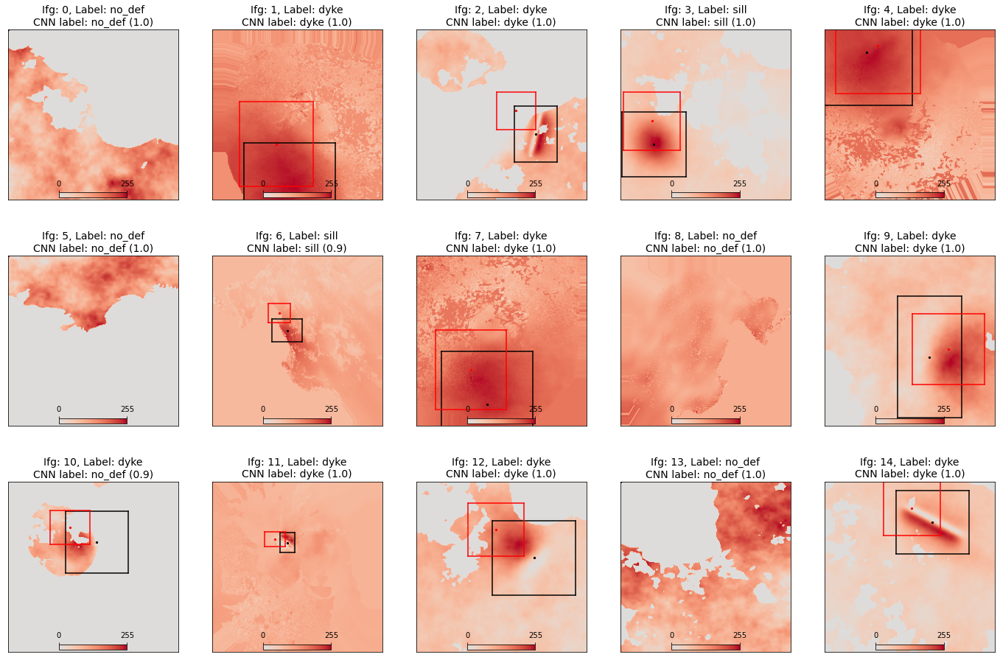

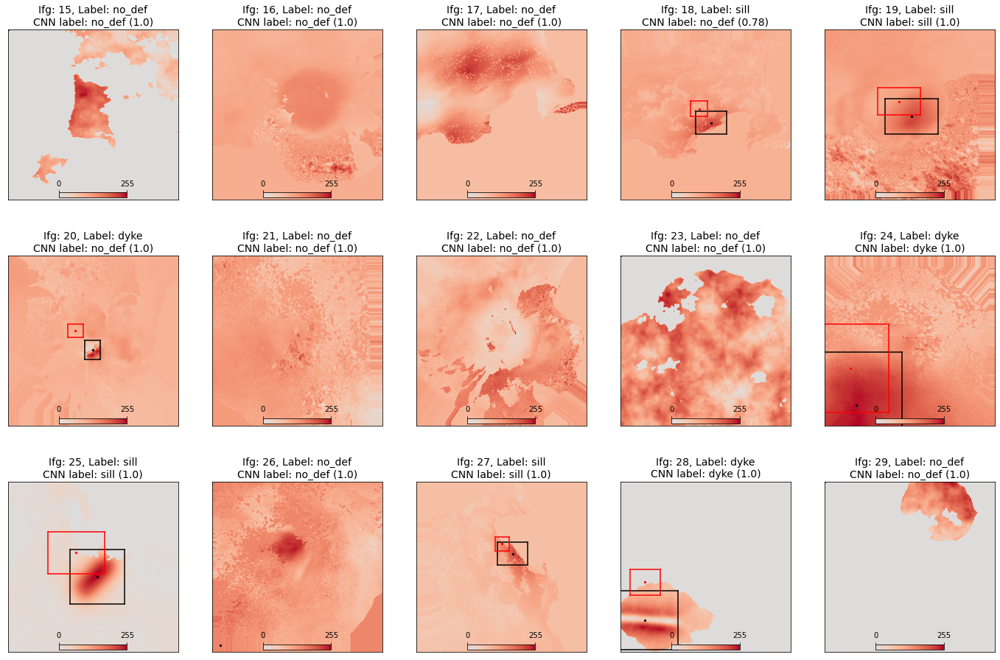

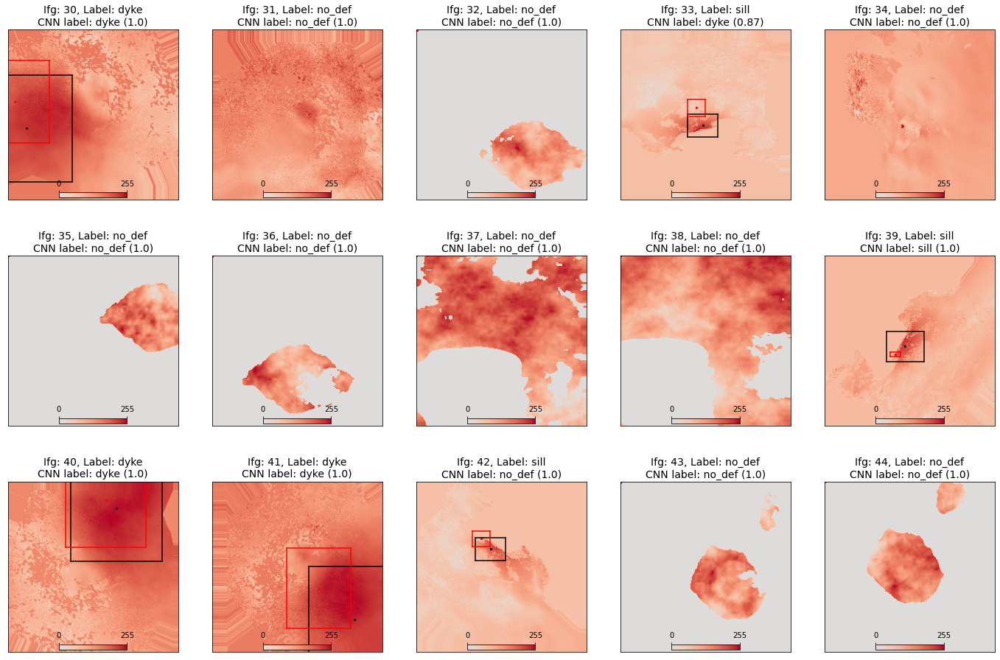

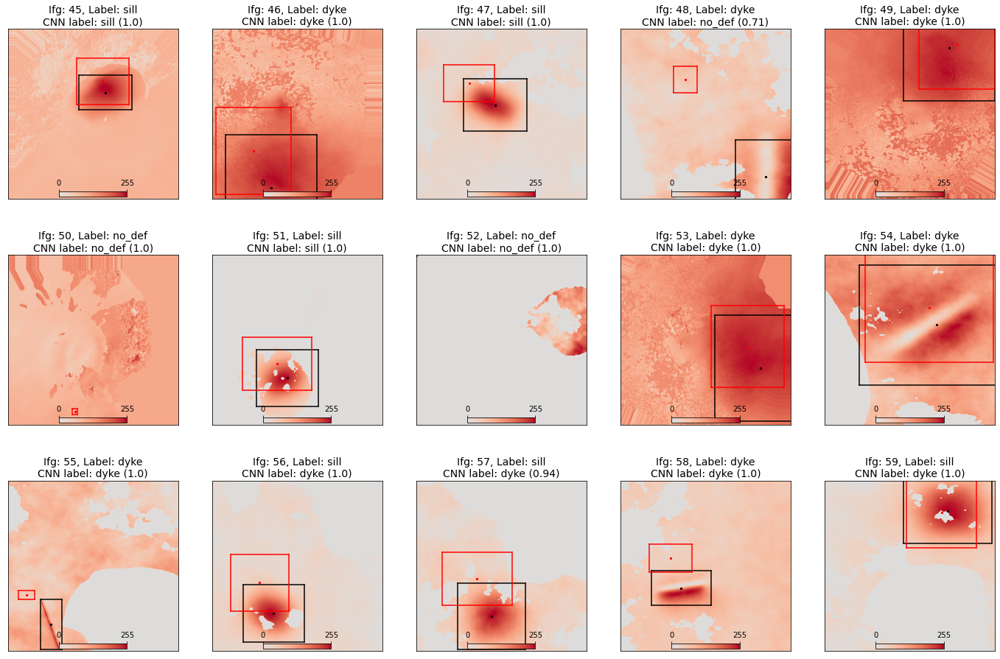

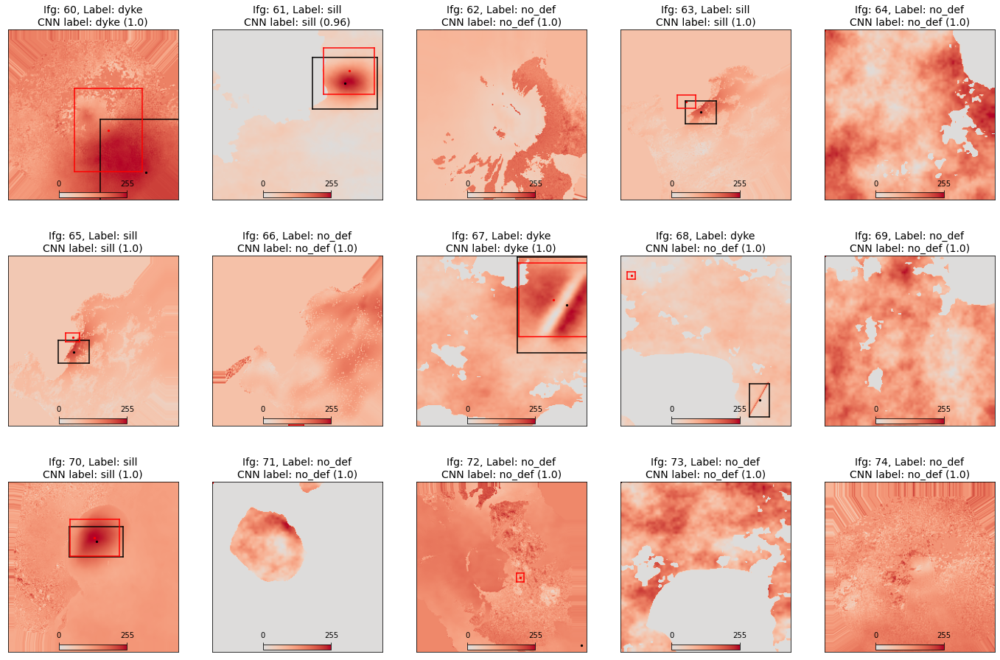

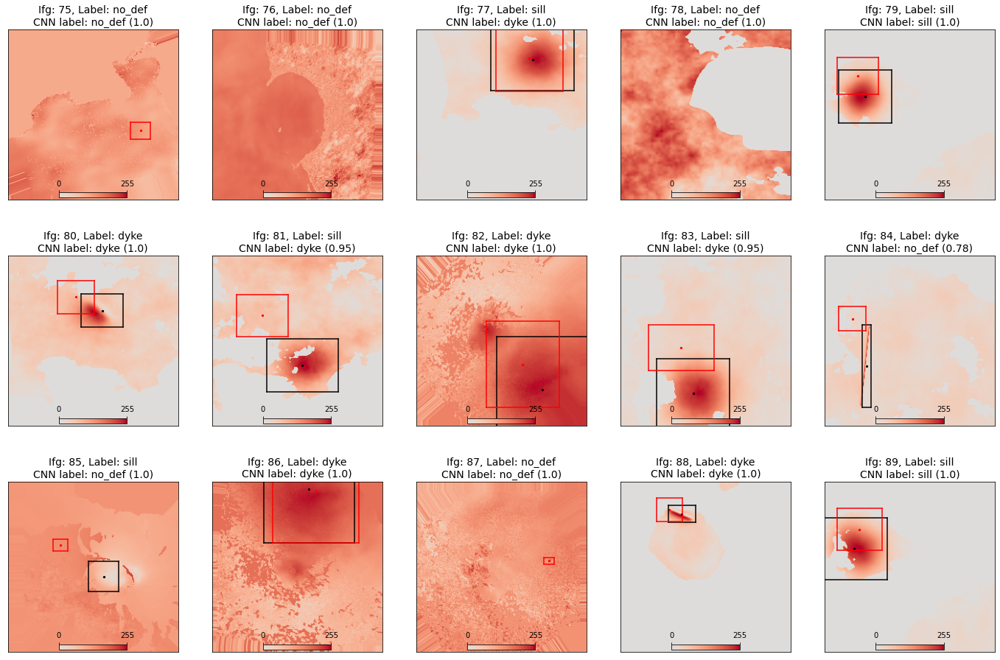

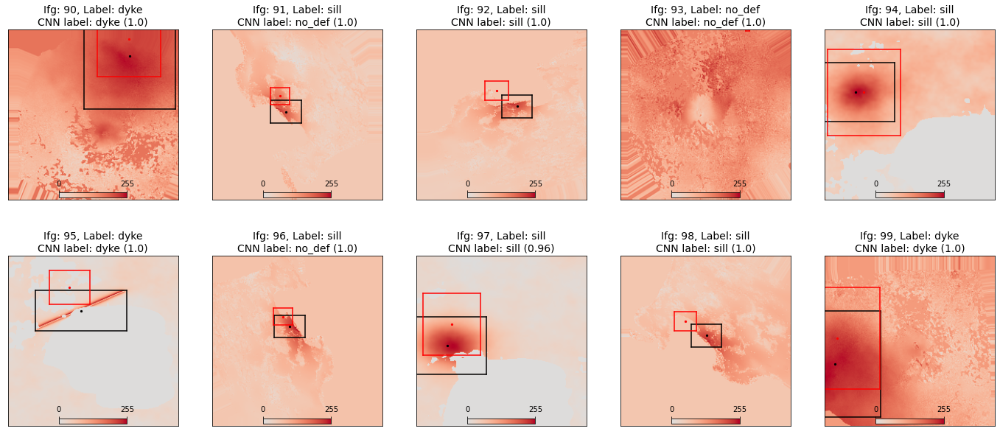

In [38]:
#%% Step 08: Test with synthetic and real data

print('\n\nStep 08: Forward pass of the testing data through the network:')

Y_class_test_cnn, Y_loc_test_cnn = vgg16_2head.predict(X_test[:,:,:,:], verbose = 1)                                    # predict class labels


plot_data_class_loc_caller(X_test, classes = Y_class_test, classes_predicted = Y_class_test_cnn,                    # plot all the testing data
                           locs = Y_loc_test, locs_predicted = Y_loc_test_cnn, 
                           source_names = synthetic_ifgs_settings['defo_sources'], window_title = 'Testing data (after step 07)')